# Lucas Chizzali - Food Deserts and Educational Performance
# New York University, CUSP

In [1]:
import pandas as pd
import numpy as np
import geopandas as gp
import pylab as pl
from shapely.geometry import Point
import pysal as ps
import mplleaflet
from scipy import stats
import statsmodels.formula.api as smf
import matplotlib as mpl
from statsmodels.graphics.api import abline_plot
from statsmodels.discrete.discrete_model import MNLogit
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error
import seaborn as sns
import requests, zipfile, StringIO
%pylab inline
pl.style.use('ggplot')

Populating the interactive namespace from numpy and matplotlib


# Contents:
#### 1. Data Cleaning, compute food desert index
#### 2. Moran's I
#### 3. Data Analysis
#### 4. Prediction Tools
    4.1 Logit
    4.2 MN Logit
    4.3 Multivariate Regression
    4.4 Random Forest

# 1. Data Cleaning

In [2]:
link = 'https://www.dropbox.com/sh/ghzperhzju2y2l7/AACGgWvjs2kLKdVYguKTvrina?dl=1'
r = requests.get(link)
zip_ = zipfile.ZipFile(StringIO.StringIO(r.content))
filename_data = 'data.geojson'
filename_grocery = 'Grocery.geojson'
filename_moran = 'Moran.geojson'

### Dataset was created through spatial joints in ArcGIS

In [3]:
df = gp.GeoDataFrame.from_file('Data/data.geojson')

In [4]:
data = df[['BORO','BORO_NUM','FID_1','SCHOOLDIST','Shape_Area','Shape_Leng','Count_','Sum_Popula','Sum_Car_Un','Sum_Bachel',
            'Sum_Colleg','Sum_High_S','Sum_W_AC','Sum_W_ELL','Sum_W_Ec','Sum_W_En','Sum_W_Ma','Sum_W_Min','Count_3','Count_2','Count_4',
          'Count_5','geometry']]

In [5]:
data.rename(columns={'FID_1':'FID','Sum_Bachel':'Bachelor','Sum_Car_Un':'Car_Unavailable',
                     'Sum_Colleg':'College','Sum_High_S':'High_School','Sum_W_AC':'Average_Class_Size',
                    'Sum_W_ELL':'Weighted_ELL','Sum_W_Ec':'Weighted_Economic_Need_Index',
                    'Sum_W_En':'Weighted_English_Grade','Sum_W_Ma':'Weighted_Math_Grade',
                    'Sum_W_Min':'Weighted_Share_Minorities','Count_3':'Grocery_Count','Count_2':'Farmers_Market_Count',
                    'Sum_Popula':'Population_Count','Count_':'School_Count_Per_Zone',
                    'Count_4':'Bus_Stops','Count_5':'Subway_Entrances'}
           ,inplace=True)

//anaconda/lib/python2.7/site-packages/pandas/core/frame.py:2524: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  **kwargs)


In [6]:
data = gp.GeoDataFrame(data) # For plotting

In [7]:
# Normalize certain variables by population, area
data['Pct_Car_Unavailable'] = data['Car_Unavailable']/(data['Population_Count']+np.exp(-10))
data['Pct_Bachelor'] = data['Bachelor']/(data['Population_Count']+np.exp(-10))
data['Pct_College'] = data['College']/(data['Population_Count']+np.exp(-10))
data['Pct_High_School'] = data['High_School']/(data['Population_Count']+np.exp(-10))

In [8]:
# Clean data
print len(data)
data_clean = data[(data['Population_Count']>0)&(data['Weighted_Math_Grade']>0)&(data['Weighted_English_Grade']>0)]
print len(data_clean)

753
604


In [9]:
data_clean.describe()

,BORO_NUM,FID,SCHOOLDIST,Shape_Area,Shape_Leng,School_Count_Per_Zone,Population_Count,Car_Unavailable,Bachelor,College,...,Weighted_Math_Grade,Weighted_Share_Minorities,Grocery_Count,Farmers_Market_Count,Bus_Stops,Subway_Entrances,Pct_Car_Unavailable,Pct_Bachelor,Pct_College,Pct_High_School
count,604.000000,604.000000,604.000000,6.040000e+02,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000,...,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000,604.000000
mean,2.958609,345.036424,18.223510,1.204061e+07,16605.612343,1.157285,12804.938742,2585.428808,1745.978477,986.437086,...,3.017883,0.680018,18.821192,0.205298,20.370861,2.801325,0.191597,0.122312,0.078827,0.149311
std,1.129996,202.155783,9.092561,1.409468e+07,9335.514859,0.856211,9135.815138,3365.598308,2314.537467,682.927073,...,0.373678,0.315567,17.562147,0.502965,19.460848,6.247010,0.098554,0.069768,0.023518,0.046395
min,1.000000,0.000000,0.000000,0.000000e+00,0.000000,1.000000,660.000000,75.000000,11.000000,27.000000,...,1.886502,0.040000,0.000000,0.000000,0.000000,0.000000,0.012004,0.016667,0.025786,0.026231
25%,2.000000,171.750000,10.000000,4.315067e+06,10510.456086,1.000000,7693.250000,1040.750000,599.000000,562.750000,...,2.720000,0.360000,8.000000,0.000000,9.000000,0.000000,0.113562,0.069697,0.060844,0.122675
50%,3.000000,340.500000,19.000000,7.839631e+06,14288.658467,1.000000,11029.500000,1842.500000,1195.500000,830.000000,...,2.970000,0.860000,15.000000,0.000000,16.000000,1.000000,0.197143,0.109111,0.076866,0.149635
75%,4.000000,517.250000,27.000000,1.436155e+07,20411.496605,1.000000,15921.750000,3093.750000,2103.500000,1310.250000,...,3.322500,0.960000,24.000000,0.000000,27.000000,4.000000,0.258867,0.152779,0.094443,0.178180
max,5.000000,752.000000,32.000000,1.375376e+08,69432.214871,15.000000,120566.000000,44404.000000,31079.000000,7800.000000,...,3.960000,1.000000,171.000000,6.000000,170.000000,71.000000,0.525613,0.379475,0.187461,0.289835


### Compute area covered by groceries for each school zone

In [10]:
import json # Import groceries with geocoded adresses from ArcGIS
pre = json.load(open('Data/Grocery.geojson',"r")) 
df = gp.GeoDataFrame.from_features(pre["features"])

In [11]:
grocery = df.set_geometry(df.apply(lambda z: Point(z.X, z.Y), axis=1)) # Create geometry
grocery.crs = {'init': 'epsg:2263'} # Set coordinate system
print len(grocery)
grocery = grocery.dropna()
grocery = grocery[(grocery['X']!=0)&(grocery['Y']!=0)] # Delete impossible values
print len(grocery) # How many groceries are left

13552
12110


In [12]:
# Save dataset
data_clean_geo = gp.GeoDataFrame(data_clean)
import json
with open('Moran.geojson', 'w') as f:
    f.write(data_clean_geo.to_json())

In [13]:
print data_clean_geo.crs # Check crs
data_clean_geo.crs = {'init': 'epsg:4326'}
print data_clean_geo.crs

None
{'init': 'epsg:4326'}


In [14]:
proj = data_clean_geo.to_crs(epsg=2263) # Project coordinate system to match data
proj = proj.reset_index()
proj.drop('index',axis=1,inplace=True)

# Create buffers
points = grocery.geometry
circles = points.buffer(1620) # Approximately 500m since projection is in feet
mp = circles.unary_union
covered_area = proj['geometry'].intersection(mp)
not_covered_area = proj['geometry'].difference(mp)
not_covered_area[:5] #Per School Zone

0    POLYGON ((982651.9123050495 151234.0456789598,...
1                                                   ()
2    POLYGON ((984314.1619888988 147019.0862012692,...
3    POLYGON ((1003103.781601157 150543.2095250119,...
4                                                   ()
dtype: object

In [15]:
ratio_ar = pd.Series(not_covered_area)
ratio_are = pd.DataFrame(ratio_ar)

In [16]:
ratio_area = ratio_are.reset_index()
ratio_area.columns = ['index','area_ratio']
ratio_area.drop('index',axis=1,inplace=True)

In [17]:
final = pd.concat([proj,ratio_area],axis=1)
del ratio_ar,ratio_are,ratio_area

In [18]:
final['area_not_covered'] = final['area_ratio'].apply(lambda x: x.area) #in square feet
final['Weighted_Grades_Total'] = final['Weighted_English_Grade'] + final['Weighted_Math_Grade']

# 2. Moran's I

### Total Weighted Grades

In [19]:
geom = ps.open('Data/Moran/Moran.shp', 'r')
print type(geom)
W = ps.buildContiguity(geom, criterion='rook', ids=final['FID'].values.tolist())
type(W)
W[20] # School Zone 20 and its neighbors

<class 'pysal.core.IOHandlers.pyShpIO.PurePyShpWrapper'>
Island ids:  [235, 316, 319, 393, 591]


{15: 1.0, 16: 1.0, 19: 1.0, 21: 1.0}

In [20]:
Y = final['Weighted_Grades_Total'].values
Y = (Y-Y.mean())/Y.std()

# Spatial lag
sp_lag = ps.lag_spatial(W, Y)
final['Weighted_Grades_Total_m'] = sp_lag
mi = ps.Moran(Y, W) #Ignore warnings

In [21]:
print "Morans's I",mi.I # Tells us whether grocery stores are clustered in New York City
print 'P-value',mi.p_sim # Tells us whether Moran's I is significant

Morans's I 0.612261126273
P-value 0.001


In [22]:
minim = final['Weighted_Grades_Total_m'].min()
maxim = final['Weighted_Grades_Total_m'].max()

//anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


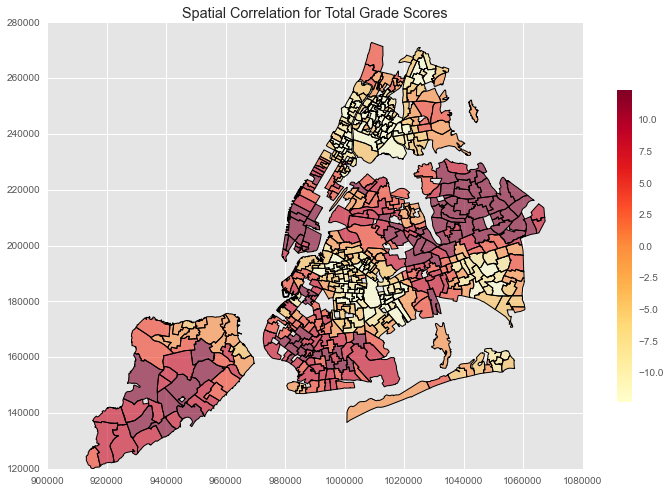

In [23]:
f, ax = pl.subplots(figsize=(12,8))
final.plot(column='Weighted_Grades_Total_m', scheme='QUANTILES', k=7, alpha=0.6, colormap='YlOrRd', axes=ax)
plt.title('Spatial Correlation for Total Grade Scores')
ax, _ = mpl.colorbar.make_axes(plt.gca(), shrink=0.7)
cbar = mpl.colorbar.ColorbarBase(ax, cmap='YlOrRd',norm=mpl.colors.Normalize(vmin=minim, vmax=maxim))

***The darker the color, the more spatially autocorrelated***

In [24]:
# Putting the same data on a mp leaflet
f, ax = pl.subplots(figsize=(10,10))
final.plot(column='Weighted_Grades_Total_m', scheme='QUANTILES', k=7, alpha=0.6, colormap='YlOrRd', axes=ax)
plt.title('Spatial Correlation for Total Grade Scores')
mplleaflet.display(fig=f, crs={'init': 'epsg:2263'},tiles=('http://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png','attribution')) # NAD83 / New York Long Island (ftUS) EPSG:2263

***Parts of Staten Island and Queens are highly, positively, spatially correlated. While the center of Brooklyn and Bronx is negatively correlated.***

In [25]:
# Moran's LISA calculation provided by PySAL.
lisa = ps.Moran_Local(Y, W)
S = lisa.p_sim < 0.05 # Only those zones that are statistically significant
Q = lisa.q # And their quadrant

# Create records for dataframe
records = map(lambda x: (final.iloc[x]['FID'], Q[x], final.geometry.iloc[x]),
              [i for i,s in enumerate(S) if s])
local_corr = gp.GeoDataFrame(records, columns=('FID', 'Quadrant', 'geometry'))
local_corr.head()

,FID,Quadrant,geometry
0,10,1,"POLYGON ((997278.3692000286 149858.7835999362,..."
1,18,1,"POLYGON ((988009.3231000541 181564.4867999652,..."
2,19,2,"POLYGON ((985753.1203000126 185781.4598999282,..."
3,27,1,"POLYGON ((981960.8216000084 158986.1599999454,..."
4,28,1,"POLYGON ((977790.8956999987 165059.6515999521,..."


In [26]:
# Tiles can be found here: https://github.com/jwass/mplleaflet/blob/master/mplleaflet/maptiles.py
f, ax = pl.subplots(1, figsize=(10,10))
local_corr.plot(column='Quadrant', scheme='QUANTILES', k=4, alpha=1, colormap='YlOrRd',axes=ax)
plt.title('Local Spatial Correlation for Total Grade Scores')
mplleaflet.display(fig=f, crs={'init': 'epsg:2263'}, tiles=('http://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png','attribution'))

***The local Moran's I shows only those areas that are significantly, spatially correlated. As can be seen, parts of Queens and Staten Island are positively correlated. Whereas Bronx and parts of Brooklyn are negatively correlated to a significant degree.***

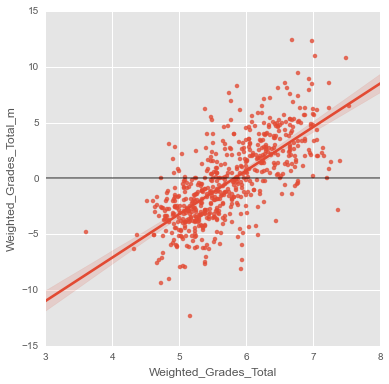

In [27]:
# Scatterplot Moran's I
f, ax = plt.subplots(1, figsize=(6,6))
sns.regplot(x='Weighted_Grades_Total', y='Weighted_Grades_Total_m', data=final)
plt.axvline(0, c='k', alpha=0.5)
plt.axhline(0, c='k', alpha=0.5)
plt.show()

There is strong spatial correlation. This makes sense since good/bad school districts are characterized by good/bad school zones, which ultimately are grouped together to create a school district.

### Food Desert Measure

In [28]:
M = final['area_not_covered'].values
M = (M-M.mean())/M.std()
# Spatial lag
sp_lag_math = ps.lag_spatial(W, M)
final['area_not_covered_m'] = sp_lag_math
mi_math = ps.Moran(M, W) #Ignore warnings
print "Morans's I",mi_math.I #Tells us whether grocery stores are clustered in New York City
print 'P-value',mi_math.p_sim #Tells us whether Moran's I is significant
minim = final['area_not_covered_m'].min()
maxim = final['area_not_covered_m'].max()
f, ax = plt.subplots(figsize=(20,15))
final.plot(column='area_not_covered', scheme='QUANTILES', k=7, alpha=0.6, colormap='YlOrRd', axes=ax)
plt.title('Spatial Correlation for area not covered by grocery stores')
mplleaflet.display(fig=f, crs={'init': 'epsg:2263'},tiles=('http://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png','attribution')) # NAD83 / New York Long Island (ftUS) EPSG:2263
#ax, _ = mpl.colorbar.make_axes(plt.gca(), shrink=0.5)
#cbar = mpl.colorbar.ColorbarBase(ax, cmap='YlOrRd',norm=mpl.colors.Normalize(vmin=minim, vmax=maxim))

Morans's I 0.409644518861
P-value 0.001


***The correlation map shows strong spatial correlation for Staten Island and East-Queens. On the other hand, negative correlation is present in the core of Brooklyn and Bronx. However, not all of these correlations are significant.
If a school zone few grocery stores, neighboring zones are likely to have fewer as well. This is intuitive for the geographical areas identified in the map.***

In [29]:
# Moran's LISA calculation provided by PySAL.
lisa_math = ps.Moran_Local(M, W)
S_math = lisa_math.p_sim < 0.05 # Only those zones that are statistically significant
Q_math = lisa_math.q # And their quadrant

# Create records for dataframe
records_food = map(lambda x: (final.iloc[x]['FID'], Q_math[x], final.geometry.iloc[x]),
              [i for i,s in enumerate(S_math) if s])
local_corr_food = gp.GeoDataFrame(records_food, columns=('FID', 'Quadrant', 'geometry'))
local_corr_food.head()

,FID,Quadrant,geometry
0,6,4,"POLYGON ((997188.6776619161 151539.7521274958,..."
1,32,3,"POLYGON ((989283.8710000106 164034.627399939, ..."
2,34,3,"POLYGON ((985995.8133999788 166308.8353999672,..."
3,35,3,(POLYGON ((985766.3646606231 171829.4717339798...
4,36,3,"POLYGON ((987948.6703000267 168771.9668999546,..."


In [30]:
f, ax = plt.subplots(1, figsize=(4,10))
local_corr_food.plot(column='Quadrant', scheme='QUANTILES', k=4, alpha=1, colormap='YlOrRd',axes=ax)
plt.title('Spatial Correlation for area not covered by grocery stores')
mplleaflet.display(fig=f, crs={'init': 'epsg:2263'},tiles=('http://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png','attribution'))
#cbar = mpl.colorbar.ColorbarBase(ax, cmap='Blues')
#norm=mpl.colors.Normalize(vmin=local_corr_math['Quadrant'].min(), vmax=local_corr_math['Quadrant'].max()))

***Indeed, as it turns out, only few of these correlations are significant.***

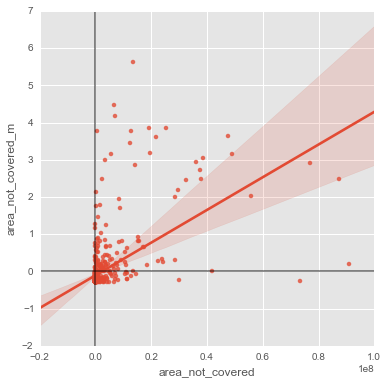

In [31]:
# Scatterplot Moran's I
f, ax = plt.subplots(1, figsize=(6,6))
sns.regplot(x='area_not_covered', y='area_not_covered_m', data=final)
plt.axvline(0, c='k', alpha=0.5)
plt.axhline(0, c='k', alpha=0.5)
plt.show()

In [32]:
# For other variables:
def moran(z,print_=None):
    try:
        M = final[z].values
        M = (M-M.mean())/M.std()
    
        # Spatial lag
        z = str(z)+'_m'
        final[z] = ps.lag_spatial(W, M)
        mi = ps.Moran(M, W) #Ignore warnings
        if print_==True:
            print '----'
            print 'Morans I for {0}'.format(z)
            print "Morans's I",mi.I #Tells us whether z values are clustered in New York City
            print 'P-value',mi.p_sim #Tells us whether Moran's I is significant
            print '----'
    except:
        pass
    # Moran's LISA calculation provided by PySAL.
    lisa = ps.Moran_Local(M, W)
    S = lisa.p_sim < 0.05 # Only those zones that are statistically significant
    Q = lisa.q # And their quadrant

    # Create records for dataframe
    records = map(lambda x: (final.iloc[x]['FID'], Q[x], final.geometry.iloc[x]),
              [i for i,s in enumerate(S) if s])
    local_corr = gp.GeoDataFrame(records, columns=('FID', 'Quadrant', 'geometry'))
    print z,'share of significant local clusters',float(len(local_corr))/float(len(final))*100

# 3. Data Analysis

### Create Categorical Variables

In [33]:
# Create a categorical variable for grades
final['Category_Grade'] = np.zeros(len(final.index)) 
#inter['Category_Grade']=0
final.Category_Grade[final.Weighted_Grades_Total<5] = 1 # Below mean/median
final.Category_Grade[(final.Weighted_Grades_Total>=5) & (final.Weighted_Grades_Total<=6.5)] = 2 # Contains mean and mode +/- std
final.Category_Grade[(final.Weighted_Grades_Total>6.5)] = 3 # Above mean/median

# Create binary y-variable for logit/machine learning
final['Grade_Binary'] = np.zeros(len(final.index))
final.Grade_Binary[final.Weighted_Grades_Total<5.7] = 0 # Below mean/median
final.Grade_Binary[final.Weighted_Grades_Total>=5.7] = 1 # Above mean/median

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

S

In [34]:
final['Subway'] = final['Subway_Entrances'] # Make it a dummy
final.Subway[final.Subway_Entrances>0] = 1

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [35]:
# make it categorical
final['uncovered_area'] = final['area_not_covered']
# print final.area_not_covered.describe()
final.uncovered_area[(final.area_not_covered<275000)&(final.area_not_covered!=0)] = 2 # Above mean
final.uncovered_area[(final.area_not_covered==0)] = 1 # Fully covered
final.uncovered_area[(final.area_not_covered>=275000)&(final.area_not_covered<=900000)] = 3 # Slightly below mean
final.uncovered_area[(final.area_not_covered>900000)] = 4 # Poorly covered
# print final.uncovered_area.describe()
# make grades categorical (once they are summed together)
# print 'Description for area not covered below its initial mean'
# print final[final['area_not_covered']>=274000]['area_not_covered'].describe()

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

Se

In [36]:
# Create subset with numerical data
inter = final[[ 'Average_Class_Size', u'Weighted_ELL', 'Weighted_Economic_Need_Index', 
               'Weighted_English_Grade', 'Weighted_Math_Grade','Category_Grade', 'Weighted_Share_Minorities',
               'Pct_Car_Unavailable', 'Pct_Bachelor', 'Pct_College', 'Pct_High_School', 
               'area_not_covered','Bus_Stops','Subway','Grocery_Count','Farmers_Market_Count','Weighted_Grades_Total',
              'uncovered_area','Grade_Binary']]

In [37]:
print inter.Weighted_Grades_Total.describe() # GPA grades range from 1-4, thus the summation will be ranging between 2-8

count    604.000000
mean       5.758363
std        0.665019
min        3.607090
25%        5.230000
50%        5.665000
75%        6.260000
max        7.530000
Name: Weighted_Grades_Total, dtype: float64


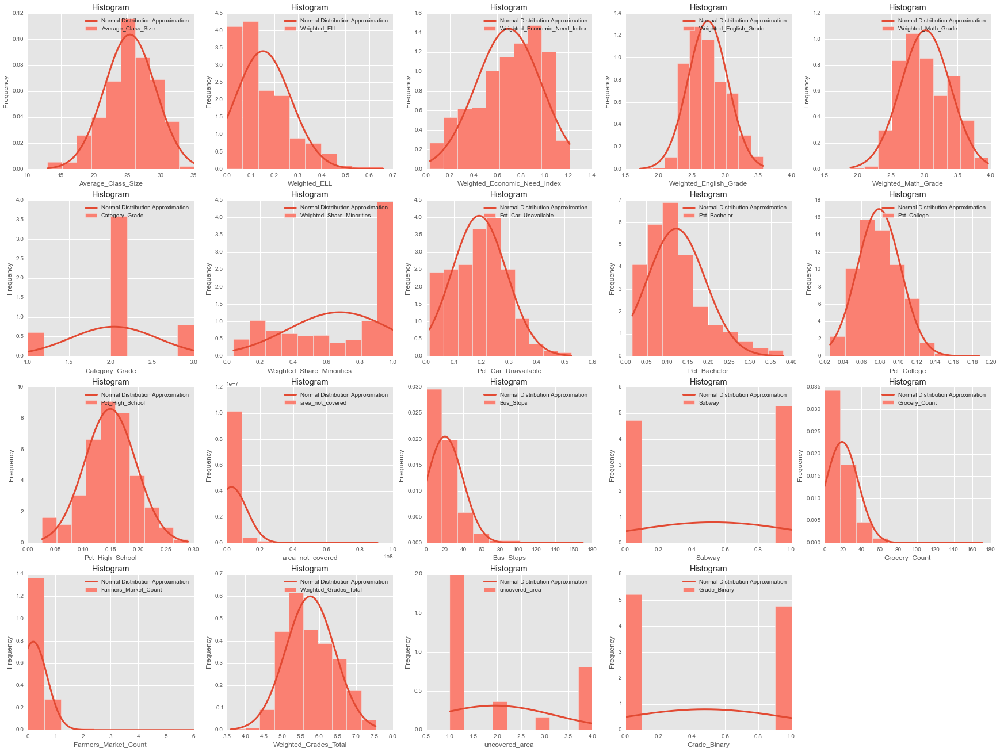

In [38]:
# Plot distributions of variables in inter
pl.figure(figsize=(30,34))
for i,z in enumerate(inter.columns):
    m, sd = stats.norm.fit(final[z])
    x = np.linspace(final[z].min(),final[z].max(),1000)
    y = stats.norm.pdf(x, m, sd)

    try:
        i = i + 1
        pl.subplot(6,5,i)
        pl.hist(final[z].values, normed=True, label=z, color='salmon')
        pl.plot(x,y, linewidth=3, label='Normal Distribution Approximation')
        pl.xlabel(z)
        pl.ylabel('Frequency')
        pl.title(r'Histogram')
        pl.legend()
    except ValueError:
        pass  

### Transform data for better fit

In [39]:
# https://onlinecourses.science.psu.edu/stat501/node/323
def transformation(z,f,i):
    data = final[z]
    data = f(data)
    m, sd = stats.norm.fit(data)
    x = np.linspace(data.min(),data.max(),1000)
    y = stats.norm.pdf(x, m, sd)
    pl.subplot(3,3,i)
    pl.hist(data, normed=True, label=z, color='salmon')
    pl.plot(x,y, linewidth=3, label='Normal Distribution Approximation')
    pl.xlabel(z)
    pl.ylabel('Frequency')
    pl.title(r'Histogram of %s Transformation'%(f))
    pl.legend()

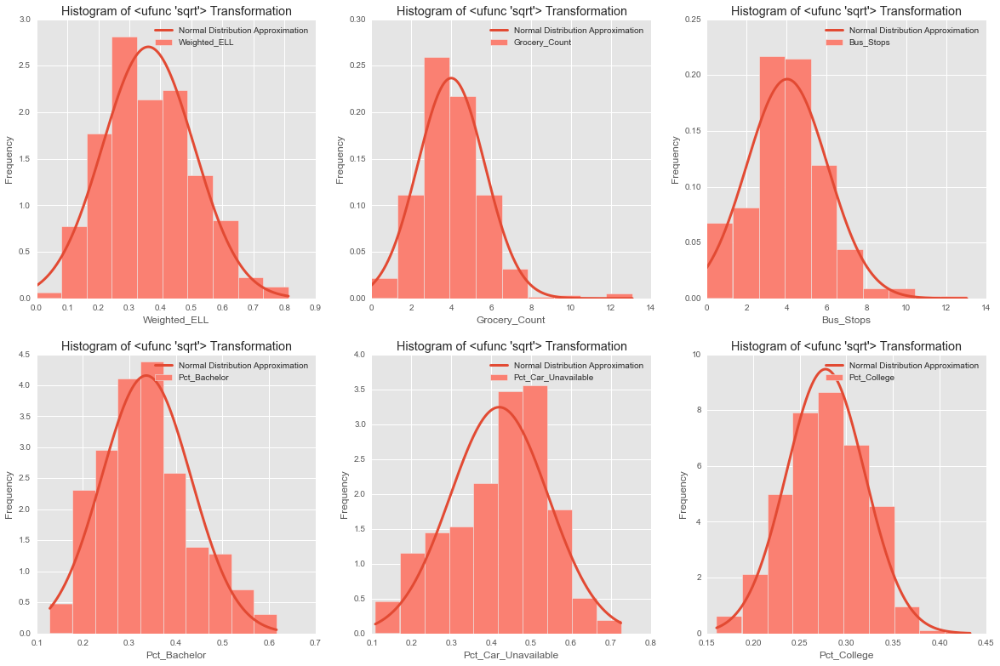

In [40]:
pl.figure(figsize=(20,20))

# Square root for Weighted_ELL
transformation('Weighted_ELL',np.sqrt,1)
# Square root for Grocery_Count
transformation('Grocery_Count',np.sqrt,2)
# Square root for Bus_Stops
transformation('Bus_Stops',np.sqrt,3)
# Log for Pct_Bachelor
transformation('Pct_Bachelor',np.sqrt,4)
# Square root for Pct_Car_Unavailable
transformation('Pct_Car_Unavailable',np.sqrt,5)
# Square root for Pct_College
transformation('Pct_College',np.sqrt,6)
# Weighted_Share_Minorities
# No transformation reaches the desired result

In [41]:
# Add new transformed variables to the dataset
final['Weighted_ELL_trans'] = np.sqrt(final['Weighted_ELL'])
final['Grocery_Count_trans'] = np.sqrt(final['Grocery_Count'])
final['Bus_Stops_trans'] = np.sqrt(final['Bus_Stops'])
final['Pct_Bachelor_trans'] = np.sqrt(final['Pct_Bachelor'])
final['Pct_Car_Unavailable_trans'] = np.sqrt(final['Pct_Car_Unavailable'])

inter = final[[ 'Grade_Binary','Average_Class_Size', 'Weighted_ELL_trans', 'Weighted_Economic_Need_Index', 
               'Weighted_English_Grade', 'Weighted_Math_Grade','Category_Grade', 'Weighted_Share_Minorities',
               'Pct_Car_Unavailable_trans', 'Pct_Bachelor_trans', 'Pct_College', 'Pct_High_School', 
               'area_not_covered','Bus_Stops_trans','Subway','Grocery_Count_trans','Farmers_Market_Count','Weighted_Grades_Total',
              'uncovered_area']]

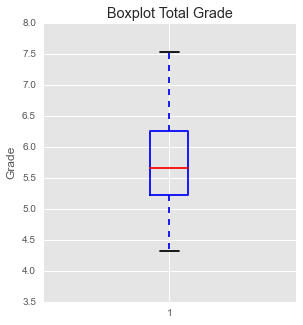

In [42]:
# Boxplot for grades
pl.figure(figsize=(10,5));
pl.subplot(121)
pl.boxplot(final['Weighted_Grades_Total']);
pl.title('Boxplot Total Grade');
pl.ylabel('Grade');

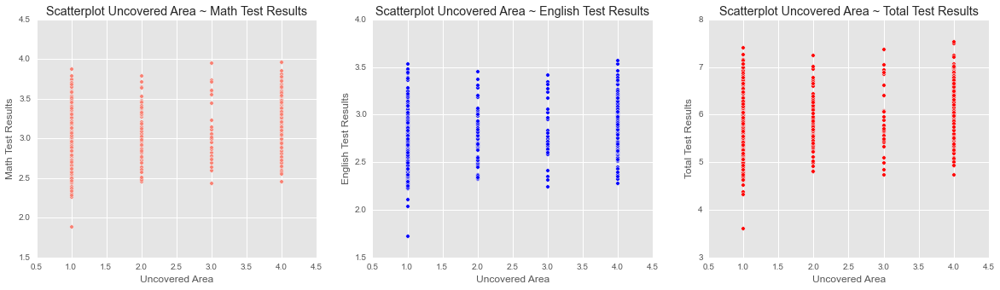

In [43]:
# Scatter plot for visualization of weak relationship
pl.figure(figsize=(20,5));
pl.subplot(131)
pl.scatter(final['uncovered_area'],final['Weighted_Math_Grade'],c='salmon');
pl.title('Scatterplot Uncovered Area ~ Math Test Results');
pl.xlabel('Uncovered Area');
pl.ylabel('Math Test Results');
pl.subplot(132)
pl.scatter(final['uncovered_area'],final['Weighted_English_Grade']);
pl.title('Scatterplot Uncovered Area ~ English Test Results');
pl.xlabel('Uncovered Area');
pl.ylabel('English Test Results');
pl.subplot(133)
pl.scatter(final['uncovered_area'],final['Weighted_Grades_Total'],c='r');
pl.title('Scatterplot Uncovered Area ~ Total Test Results');
pl.xlabel('Uncovered Area');
pl.ylabel('Total Test Results');

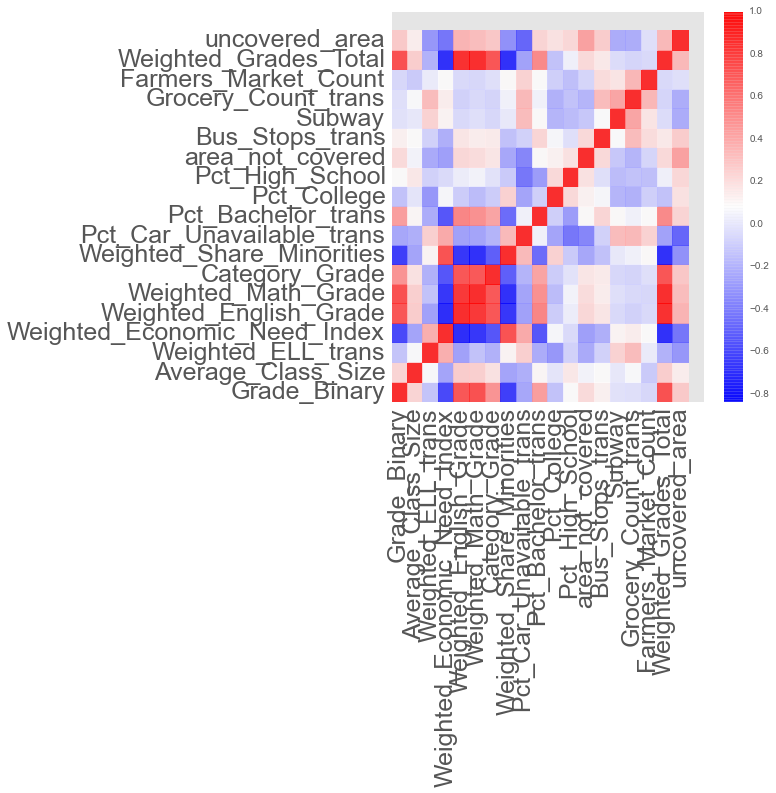

In [44]:
# Correlation Matrix
fig, ax = pl.subplots(figsize=(7,7))
R = inter.corr()
pl.pcolor(R, label=inter.columns, alpha=0.8, cmap='bwr') # or seismic
pl.colorbar()
yticks(arange(0.5,19.5),range(0,20)) # Adjust y,x range
xticks(arange(0.5,19.5),range(0,20))
labels = [item.get_text() for item in ax.get_xticklabels()]
for i,v in zip(inter.columns,range(len(inter.columns))):
    labels[v] = i
ax.set_xticklabels(labels, rotation=90)
ax.set_yticklabels(labels)
pl.tick_params(axis='both', which='major', labelsize=25)

### Correlation

1. Grade variables are highly negatively correlated with the need index and the share of minorities, whereas area not covered by grocery stores is weakly, positively correlated.
2. The percentage of cars available is negatively correlated with area not covered by grocery stores.
3. The economic need index is negatively correlated with the percentage of Bachelor degrees. 
4. The percentage of High School Diplomas is negatively correlated with unavailability of cars.
5. Uncovered area is also slightly negatively correlated with the economic need index.

In [45]:
inter.corr()

,Grade_Binary,Average_Class_Size,Weighted_ELL_trans,Weighted_Economic_Need_Index,Weighted_English_Grade,Weighted_Math_Grade,Category_Grade,Weighted_Share_Minorities,Pct_Car_Unavailable_trans,Pct_Bachelor_trans,Pct_College,Pct_High_School,area_not_covered,Bus_Stops_trans,Subway,Grocery_Count_trans,Farmers_Market_Count,Weighted_Grades_Total,uncovered_area
Grade_Binary,1.000000,0.247767,-0.161515,-0.711529,0.813143,0.837871,0.535749,-0.753539,-0.288536,0.491496,-0.167555,0.084562,0.224163,0.131460,-0.030767,-0.036182,-0.074729,0.837450,0.298953
Average_Class_Size,0.247767,1.000000,0.068213,-0.305363,0.286115,0.272481,0.190686,-0.299176,-0.254474,0.107975,-0.013886,0.162774,0.049926,0.086748,-0.002267,0.074174,-0.133511,0.282117,0.139796
Weighted_ELL_trans,-0.161515,0.068213,1.000000,0.413421,-0.318087,-0.168583,-0.245528,0.116232,0.270809,-0.267985,-0.361302,-0.099624,-0.276141,-0.103053,0.258019,0.356647,0.015330,-0.238153,-0.360998
Weighted_Economic_Need_Index,-0.711529,-0.305363,0.413421,1.000000,-0.837082,-0.789879,-0.655584,0.829759,0.435198,-0.656700,0.064713,-0.057308,-0.323531,-0.250384,0.112683,0.146028,0.087003,-0.821277,-0.510802
Weighted_English_Grade,0.813143,0.286115,-0.318087,-0.837082,1.000000,0.949137,0.810816,-0.791765,-0.318134,0.603379,-0.126391,0.021497,0.234391,0.172859,-0.062764,-0.100775,-0.062572,0.984225,0.391481
Weighted_Math_Grade,0.837871,0.272481,-0.168583,-0.789879,0.949137,1.000000,0.805970,-0.819068,-0.299663,0.551812,-0.198012,0.046698,0.217016,0.145285,-0.037532,-0.065268,-0.071289,0.989871,0.351294
Category_Grade,0.535749,0.190686,-0.245528,-0.655584,0.810816,0.805970,1.000000,-0.608337,-0.230734,0.468925,-0.120936,-0.019914,0.171190,0.146899,-0.073194,-0.084282,-0.036910,0.818475,0.306319
Weighted_Share_Minorities,-0.753539,-0.299176,0.116232,0.829759,-0.791765,-0.819068,-0.608337,1.000000,0.364182,-0.552416,0.261289,-0.129643,-0.290196,-0.174909,0.007178,0.044552,0.092726,-0.817245,-0.389766
Pct_Car_Unavailable_trans,-0.288536,-0.254474,0.270809,0.435198,-0.318134,-0.299663,-0.230734,0.364182,1.000000,0.042887,-0.299924,-0.500518,-0.436555,-0.104731,0.354902,0.369367,0.259092,-0.311829,-0.585020
Pct_Bachelor_trans,0.491496,0.107975,-0.267985,-0.656700,0.603379,0.551812,0.468925,-0.552416,0.042887,1.000000,-0.106630,-0.336618,0.094816,0.239621,0.095042,0.041730,0.084014,0.582129,0.253126


In [46]:
# Dataset for categorical
mnlogit_var = inter[['Category_Grade','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index',
                   'Weighted_Share_Minorities','Grocery_Count_trans','Farmers_Market_Count',
                  'Pct_Car_Unavailable_trans','Pct_Bachelor_trans','Pct_College','Pct_High_School','Subway',
                   'Bus_Stops_trans','uncovered_area']]
# Dataset for binary
logit_var = inter[['Grade_Binary','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index',
                   'Weighted_Share_Minorities','Farmers_Market_Count',
                  'Pct_Car_Unavailable_trans','Pct_Bachelor_trans','Pct_College','Pct_High_School','Subway',
                   'Bus_Stops_trans','uncovered_area']]

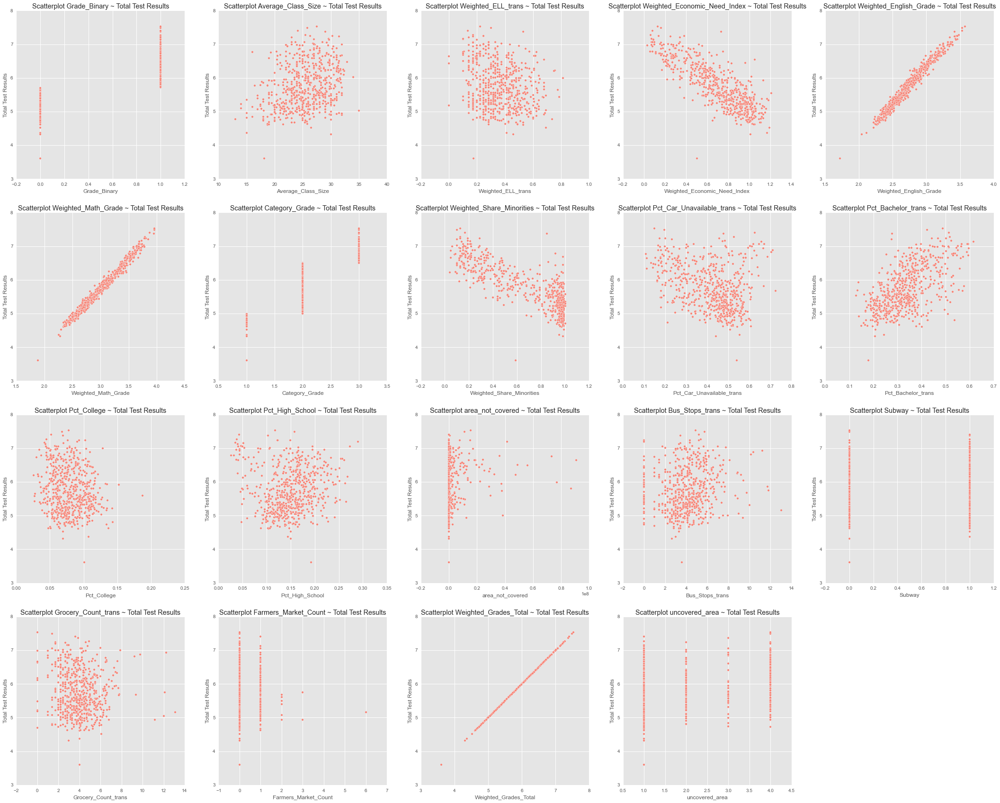

In [47]:
pl.figure(figsize=(37,37));
for i,z in enumerate(inter.columns):
    i = 1 + i
    pl.subplot(5,5,i)
    pl.scatter(final[z],final['Weighted_Grades_Total'],c='salmon');
    pl.title('Scatterplot %s ~ Total Test Results' %(z));
    pl.xlabel('%s' %(z));
    pl.ylabel('Total Test Results');

## Fitted Scatterplots

### Categorical dependent variable

In [48]:
model = smf.ols(formula = 'Category_Grade ~ uncovered_area',data=mnlogit_var,missing='drop').fit()
model_alt = smf.ols(formula = 'Category_Grade ~ Grocery_Count_trans',data=mnlogit_var,missing='drop').fit()

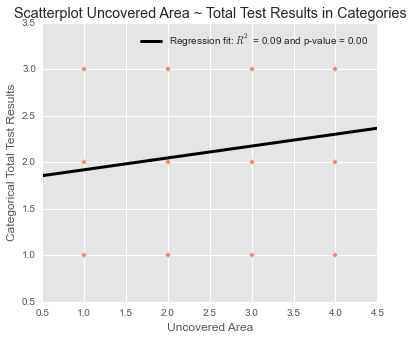

In [49]:
fig, ax = pl.subplots(figsize=(6,5));
pl.scatter(final['uncovered_area'],final['Category_Grade'],c='salmon');
abline_plot(model_results=model, ax=ax, label='Regression fit: $R^2$ = {0:.2f} and p-value = {1:.2f}'.format(model.rsquared,model.pvalues[1]),c='k', linewidth=3)
pl.title('Scatterplot Uncovered Area ~ Total Test Results in Categories');
pl.xlabel('Uncovered Area'); # 4 is poorly covered
pl.ylabel('Categorical Total Test Results');
pl.legend()

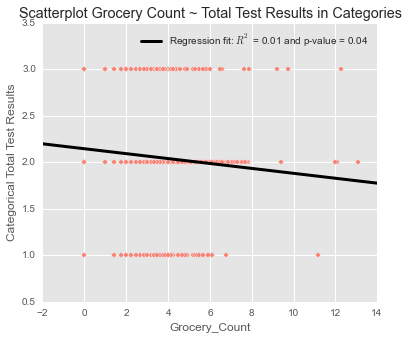

In [50]:
fig, ax = pl.subplots(figsize=(6,5));
pl.scatter(final['Grocery_Count_trans'],final['Category_Grade'],c='salmon');
abline_plot(model_results=model_alt, ax=ax, label='Regression fit: $R^2$ = {0:.2f} and p-value = {1:.2f}'.format(model_alt.rsquared,model_alt.pvalues[1]),c='k', linewidth=3)
pl.title('Scatterplot Grocery Count ~ Total Test Results in Categories');
pl.xlabel('Grocery_Count');
pl.ylabel('Categorical Total Test Results');
pl.legend()

### Continious dependent variable

In [51]:
model = smf.ols(formula = 'Weighted_Grades_Total ~ uncovered_area',data=inter,missing='drop').fit()
model_alt = smf.ols(formula = 'Weighted_Grades_Total ~ Grocery_Count_trans',data=inter,missing='drop').fit()

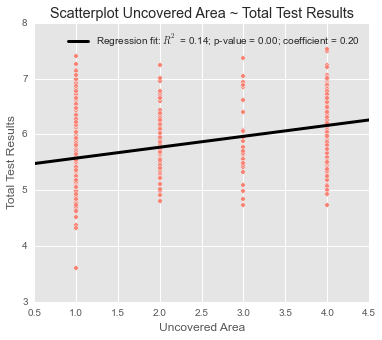

In [52]:
fig, ax = pl.subplots(figsize=(6,5));
pl.scatter(final['uncovered_area'],final['Weighted_Grades_Total'],c='salmon');
abline_plot(model_results=model, ax=ax, label='Regression fit: $R^2$ = {0:.2f}; p-value = {1:.2f}; coefficient = {2:.2f}'.format(model.rsquared,model.pvalues[1],model.params[1]),c='k', linewidth=3)
pl.title('Scatterplot Uncovered Area ~ Total Test Results');
pl.xlabel('Uncovered Area');
pl.ylabel('Total Test Results');
pl.legend()

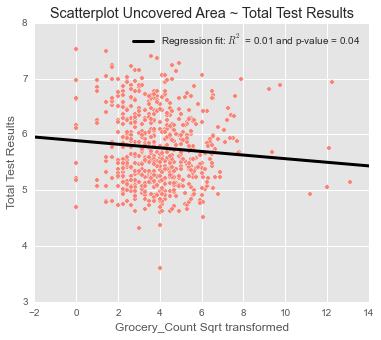

In [53]:
fig, ax = pl.subplots(figsize=(6,5));
pl.scatter(final['Grocery_Count_trans'],final['Weighted_Grades_Total'],c='salmon');
abline_plot(model_results=model_alt, ax=ax, label='Regression fit: $R^2$ = {0:.2f} and p-value = {1:.2f}'.format(model_alt.rsquared,model_alt.pvalues[1]),c='k', linewidth=3)
pl.title('Scatterplot Uncovered Area ~ Total Test Results');
pl.xlabel('Grocery_Count Sqrt transformed');
pl.ylabel('Total Test Results');
pl.legend()

# Prediction Tools

## 1. Logit

In [54]:
formula = 'Grade_Binary ~ uncovered_area + Average_Class_Size + Weighted_ELL_trans + Weighted_Economic_Need_Index + Weighted_Share_Minorities+Farmers_Market_Count+Pct_Car_Unavailable_trans + Pct_Bachelor_trans + Pct_College + Pct_High_School + Bus_Stops_trans + Subway'
logit_mod = smf.logit(formula=formula, data = logit_var).fit()
print logit_mod.summary()
marginal = logit_mod.get_margeff()
print marginal.summary()

Optimization terminated successfully.
         Current function value: 0.299890
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:           Grade_Binary   No. Observations:                  604
Model:                          Logit   Df Residuals:                      591
Method:                           MLE   Df Model:                           12
Date:                Sun, 06 Mar 2016   Pseudo R-squ.:                  0.5668
Time:                        20:58:33   Log-Likelihood:                -181.13
converged:                       True   LL-Null:                       -418.10
                                        LLR p-value:                 7.760e-94
                                   coef    std err          z      P>|z|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------------------
Intercept                       10.1783      2.409      4.226      0.000

### Take only significant variables based on stepwise selection

In [55]:
formula = 'Grade_Binary ~ Weighted_Economic_Need_Index + Weighted_Share_Minorities + uncovered_area'
logit_mod1 = smf.logit(formula=formula, data = final).fit()
print logit_mod1.summary()
marginal = logit_mod1.get_margeff()
print marginal.summary()

Optimization terminated successfully.
         Current function value: 0.302756
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:           Grade_Binary   No. Observations:                  604
Model:                          Logit   Df Residuals:                      600
Method:                           MLE   Df Model:                            3
Date:                Sun, 06 Mar 2016   Pseudo R-squ.:                  0.5626
Time:                        20:58:33   Log-Likelihood:                -182.86
converged:                       True   LL-Null:                       -418.10
                                        LLR p-value:                1.194e-101
                                   coef    std err          z      P>|z|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------------------
Intercept                        8.6473      0.853     10.140      0.000

## 2. Multinomial Logit

In [56]:
xvariables = ['uncovered_area','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index','Weighted_Share_Minorities','Farmers_Market_Count','Pct_Car_Unavailable_trans','Pct_Bachelor_trans','Pct_College','Pct_High_School','Bus_Stops_trans','Subway']
formula = 'Category_Grade ~ uncovered_area + Average_Class_Size + Weighted_ELL_trans + Weighted_Economic_Need_Index + Weighted_Share_Minorities + Farmers_Market_Count + Pct_Car_Unavailable_trans + Pct_Bachelor_trans + Pct_College + Pct_High_School + Bus_Stops_trans + Subway'

In [57]:
# http://statsmodels.sourceforge.net/devel/generated/statsmodels.discrete.discrete_model.MNLogit.html
# Or SPSS: Analyze > Regression > Multinomial Logistic
logitmn_model = MNLogit.from_formula(formula=formula,data=final,eval_env=-1).fit_regularized()
print logitmn_model.summary()

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45186395172
            Iterations: 245
            Function evaluations: 251
            Gradient evaluations: 245
                          MNLogit Regression Results                          
Dep. Variable:         Category_Grade   No. Observations:                  604
Model:                        MNLogit   Df Residuals:                      578
Method:                           MLE   Df Model:                           24
Date:                Sun, 06 Mar 2016   Pseudo R-squ.:                  0.4255
Time:                        20:58:33   Log-Likelihood:                -272.93
converged:                       True   LL-Null:                       -475.11
                                        LLR p-value:                 9.550e-71
            Category_Grade=2       coef    std err          z      P>|z|      [95.0% Conf. Int.]
--------------------------------------------------------------

In [58]:
marginal = logitmn_model.get_margeff()
print marginal.summary()

       MNLogit Marginal Effects      
Dep. Variable:         Category_Grade
Method:                          dydx
At:                           overall
            Category_Grade=1      dy/dx    std err          z      P>|z|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------------------
uncovered_area                   0.0045      0.016      0.285      0.775        -0.026     0.035
Average_Class_Size              -0.0027      0.003     -0.864      0.387        -0.009     0.003
Weighted_ELL_trans               0.0614      0.106      0.582      0.561        -0.145     0.268
Weighted_Economic_Need_Index     0.3854      0.127      3.045      0.002         0.137     0.634
Weighted_Share_Minorities        0.3199      0.170      1.886      0.059        -0.013     0.652
Farmers_Market_Count            -0.0113      0.024     -0.475      0.635        -0.058     0.036
Pct_Car_Unavailable_trans        0.2893      0.209      1.385      0.166

So for x2, -0.1427 means that an increase in this variable increases the probability of y to be in the lower category.
For grade = 3 => it means that it is more likely that the resulting grade is 2.

## 3. Multivariate Regression

In [59]:
formula = 'Weighted_Grades_Total  ~  uncovered_area   +   Average_Class_Size   +   Weighted_ELL_trans   +   Weighted_Economic_Need_Index   +   Weighted_Share_Minorities   + Farmers_Market_Count + Pct_Car_Unavailable_trans   +   Pct_Bachelor_trans   +   Pct_College   +   Pct_High_School   +   Bus_Stops_trans   +   Subway  '
model = smf.ols(formula = formula,data=final,missing='drop').fit()
print model.summary()

                              OLS Regression Results                             
Dep. Variable:     Weighted_Grades_Total   R-squared:                       0.740
Model:                               OLS   Adj. R-squared:                  0.735
Method:                    Least Squares   F-statistic:                     140.1
Date:                   Sun, 06 Mar 2016   Prob (F-statistic):          6.35e-164
Time:                           20:58:33   Log-Likelihood:                -203.41
No. Observations:                    604   AIC:                             432.8
Df Residuals:                        591   BIC:                             490.1
Df Model:                             12                                         
Covariance Type:               nonrobust                                         
                                   coef    std err          t      P>|t|      [95.0% Conf. Int.]
-----------------------------------------------------------------------------------

*** There is a weak collinearity between Economic Need Index and Share of Minorities***. 

### R regression diagnostics

In [73]:
#inter.to_csv('Rdata.csv') # For further analysis in R Studio

In [61]:
#from IPython.display import Image
#Image(filename='R/Diagnostics.jpeg') 

### VIF values
- uncovered_area = 1.920318           
- Average_Class_Size = 1.223178           
- Weighted_ELL_trans = 1.846742 
- Weighted_Economic_Need_Index = 6.651882      
- Weighted_Share_Minorities = 4.734646     
- Pct_Car_Unavailable_trans = 2.615225 
- Pct_Bachelor_trans = 2.768715                 
- Pct_College = 1.582086               
- Pct_High_School = 1.707522 
- Bus_Stops_trans = 1.165465                      
- Subway 1.251899                                          

#### Keeping the VIF values in mind, the analysis proceeds to the next step

Using the stepAIC(fit, direction="both") in R, this is the final model:

In [62]:
formula = 'Weighted_Grades_Total ~ Weighted_Economic_Need_Index + Weighted_Share_Minorities + Pct_Bachelor_trans + Bus_Stops_trans'
model = smf.ols(formula = formula,data=inter,missing='drop').fit()
print model.summary()

                              OLS Regression Results                             
Dep. Variable:     Weighted_Grades_Total   R-squared:                       0.738
Model:                               OLS   Adj. R-squared:                  0.736
Method:                    Least Squares   F-statistic:                     421.6
Date:                   Sun, 06 Mar 2016   Prob (F-statistic):          1.48e-172
Time:                           20:58:33   Log-Likelihood:                -205.74
No. Observations:                    604   AIC:                             421.5
Df Residuals:                        599   BIC:                             443.5
Df Model:                              4                                         
Covariance Type:               nonrobust                                         
                                   coef    std err          t      P>|t|      [95.0% Conf. Int.]
-----------------------------------------------------------------------------------

***VIF values are in an acceptable range***

In [63]:
#Image(filename='R/DiagnosticsIII.jpeg') 

## 5. Random Forest

In [64]:
np.random.seed(12345)
logit_var['index'] = np.random.uniform(low = 0, high = 1, size = len(logit_var))
logit_var['test'] = pd.get_dummies(logit_var['index'] <= 0.3333)[1]

del logit_var['index']

test = logit_var[logit_var['test'] == 1]
train = logit_var[logit_var['test'] == 0]

/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [65]:
np.random.seed(123)

ytrain = train['Grade_Binary'].as_matrix(columns=None)
ytest = test['Grade_Binary'].as_matrix(columns=None)

Xtrain = train[['uncovered_area','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index',
                'Weighted_Share_Minorities','Pct_Car_Unavailable_trans','Farmers_Market_Count','Pct_Bachelor_trans',
                'Pct_College','Pct_High_School','Bus_Stops_trans','Subway']].as_matrix(columns=None)
Xtest = test[['uncovered_area','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index',
              'Weighted_Share_Minorities','Farmers_Market_Count','Pct_Car_Unavailable_trans','Pct_Bachelor_trans',
              'Pct_College','Pct_High_School','Bus_Stops_trans','Subway']].as_matrix(columns=None)

y = np.append(ytrain, ytest, axis=0)
X = np.append(Xtrain, Xtest, axis=0)

rf = RandomForestClassifier(n_estimators = 30)
rf.fit(Xtrain, ytrain)
ypred = rf.predict(Xtest)
cm = confusion_matrix(ytest, ypred)
RFcm = cm
rfMSE = mean_squared_error(ytest, ypred)

rfACC = (float(cm[0][0] + cm[1][1])) / (len(ypred))

table = [[" ","0", "1"],
         ["0", cm[0][0], cm[0][1]], 
         ["1", cm[1][0], cm[1][1]]]

from tabulate import tabulate
print "The confusion matrix is:"
print tabulate(table, tablefmt="fancy_grid", numalign = "center")
print "The Accuracy Rate is", rfACC
print "The Mean Squared Error is", rfMSE

The confusion matrix is:
╒═══╤════╤════╕
│   │ 0  │ 1  │
├───┼────┼────┤
│ 0 │ 94 │ 15 │
├───┼────┼────┤
│ 1 │ 14 │ 73 │
╘═══╧════╧════╛
The Accuracy Rate is 0.852040816327
The Mean Squared Error is 0.147959183673


### Only significant variables based on the logit

In [66]:
Xtrain = train[['Weighted_Share_Minorities','Weighted_Economic_Need_Index']].as_matrix(columns=None)
Xtest = test[['Weighted_Share_Minorities','Weighted_Economic_Need_Index']].as_matrix(columns=None)

y = np.append(ytrain, ytest, axis=0)
X = np.append(Xtrain, Xtest, axis=0)

rf = RandomForestClassifier(n_estimators = 30)
rf.fit(Xtrain, ytrain)
ypred = rf.predict(Xtest)
cm = confusion_matrix(ytest, ypred)
RFcm = cm
rfMSE = mean_squared_error(ytest, ypred)

rfACC = (float(cm[0][0] + cm[1][1])) / (len(ypred))

table = [[" ","0", "1"],
         ["0", cm[0][0], cm[0][1]], 
         ["1", cm[1][0], cm[1][1]]]

from tabulate import tabulate
print "The confusion matrix is:"
print tabulate(table, tablefmt="fancy_grid", numalign = "center")
print "The Accuracy Rate is", rfACC
print "The Mean Squared Error is", rfMSE

The confusion matrix is:
╒═══╤════╤════╕
│   │ 0  │ 1  │
├───┼────┼────┤
│ 0 │ 96 │ 13 │
├───┼────┼────┤
│ 1 │ 18 │ 69 │
╘═══╧════╧════╛
The Accuracy Rate is 0.841836734694
The Mean Squared Error is 0.158163265306


# Appendix: Tables and Figures for research paper

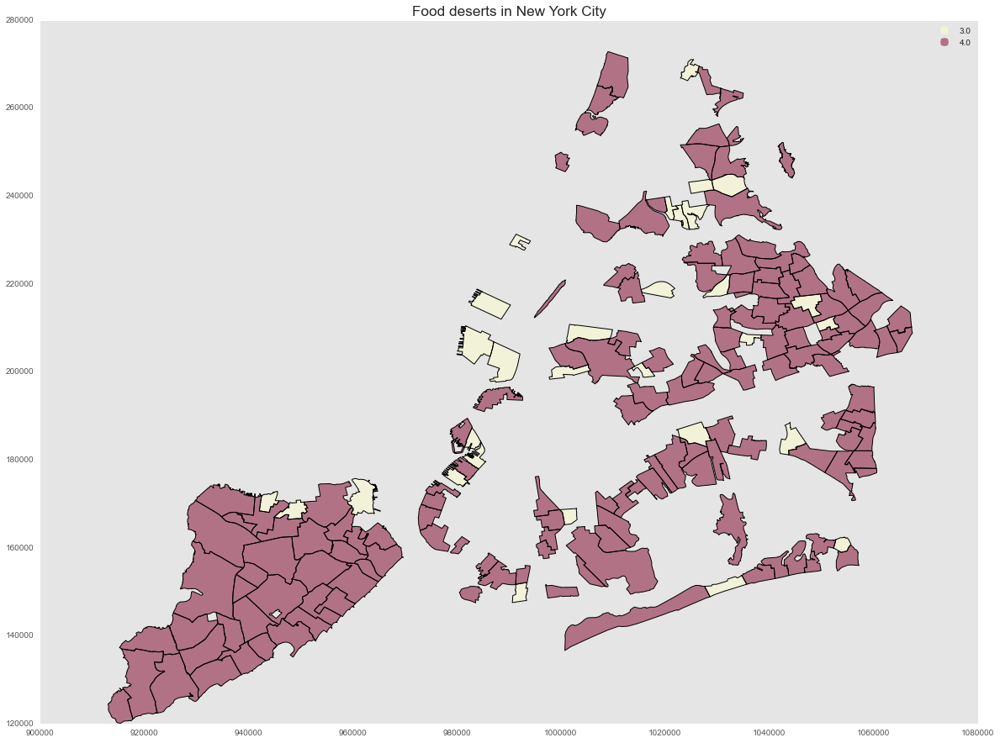

In [67]:
f, ax = plt.subplots(figsize=(20,15))
df = final[final['uncovered_area']>2][['BORO_NUM','SCHOOLDIST','uncovered_area','Weighted_Grades_Total','geometry']]
df = gp.GeoDataFrame(df)
df.plot(column='uncovered_area',colormap='YlOrRd',axes=ax, legend=True, categorical=True)
plt.grid('off')
plt.title('Food deserts in New York City')
matplotlib.rcParams.update({'font.size': 12})
plt.savefig('Foodds.png')

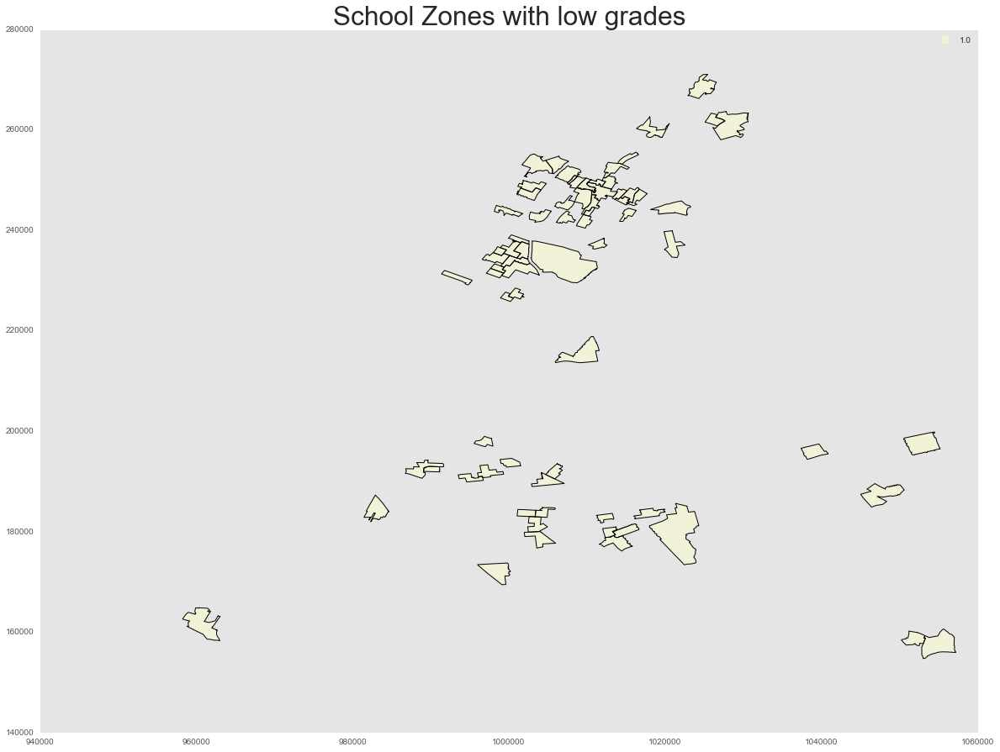

In [68]:
f, ax = plt.subplots(figsize=(20,15))
df = final[final['Category_Grade']<2][['BORO_NUM','SCHOOLDIST','uncovered_area','Category_Grade','geometry']]
df = gp.GeoDataFrame(df)
df.plot(column='Category_Grade',colormap='YlOrRd',axes=ax, legend=True, categorical=True)
plt.grid('off')
plt.title('School Zones with low grades')
matplotlib.rcParams.update({'font.size': 22})
plt.savefig('Grades.png')

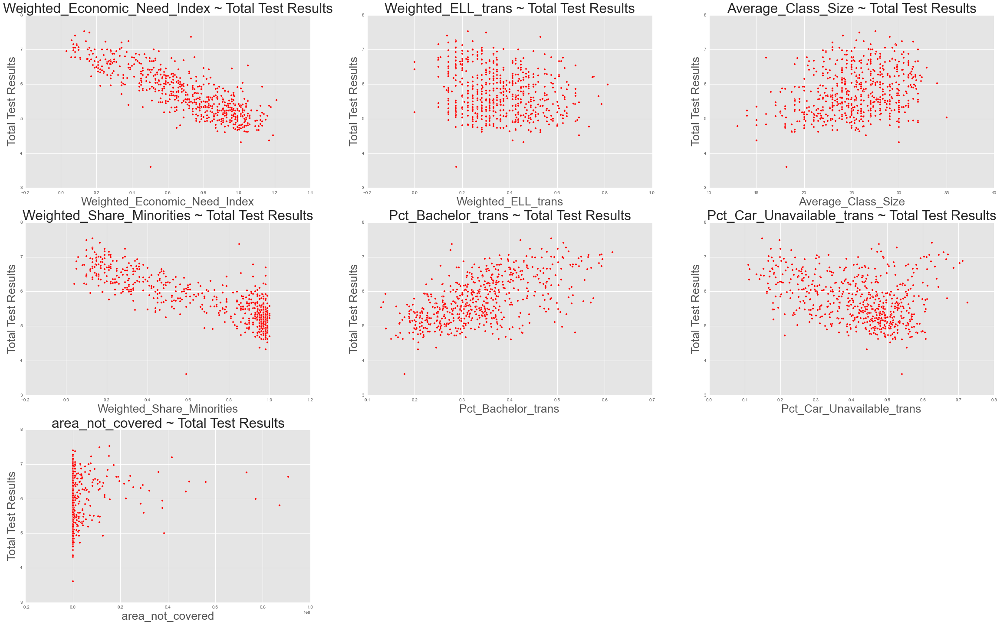

In [69]:
# Of importance:
picture = final[['Weighted_Economic_Need_Index','Weighted_ELL_trans','Average_Class_Size','Weighted_Share_Minorities',
                'Pct_Bachelor_trans','Pct_Car_Unavailable_trans','area_not_covered']]
plt.figure(figsize=(40,50))
for i,z in enumerate(picture.columns):
    i = 1 + i
    pl.subplot(6,3,i)
    pl.scatter(final[z],final['Weighted_Grades_Total'],c='red');
    pl.title('%s ~ Total Test Results' %(z));
    pl.xlabel('%s' %(z));
    pl.ylabel('Total Test Results');
plt.savefig("Scatter.png")

12


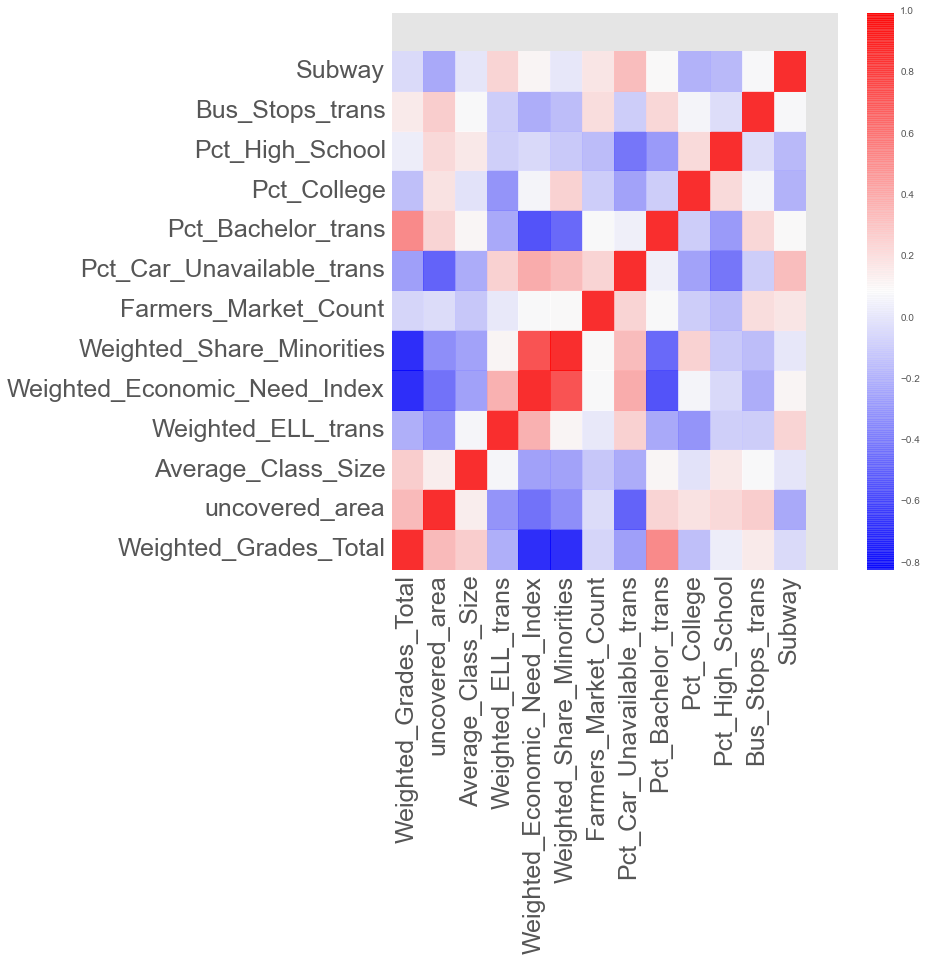

In [70]:
# Correlation Matrix
variables_ = final[['Weighted_Grades_Total','uncovered_area','Average_Class_Size','Weighted_ELL_trans','Weighted_Economic_Need_Index','Weighted_Share_Minorities','Farmers_Market_Count','Pct_Car_Unavailable_trans','Pct_Bachelor_trans','Pct_College','Pct_High_School','Bus_Stops_trans','Subway']]
maxim = np.max(range(len(variables_.columns)))
print maxim
fig, ax = pl.subplots(figsize=(10,10))
R = variables_.corr()
pl.pcolor(R, label=variables_.columns, alpha=0.8, cmap='bwr') # or seismic
pl.colorbar()
yticks(arange(0.5,13.5),range(0,14)) # Adjust y,x range
xticks(arange(0.5,13.5),range(0,14))
labels = [item.get_text() for item in ax.get_xticklabels()]
for i,v in zip(variables_.columns,range(len(variables_.columns))):
    labels[v] = i
ax.set_xticklabels(labels, rotation=90)
ax.set_yticklabels(labels)
pl.tick_params(axis='both', which='major', labelsize=25)
plt.savefig("CorrMatrix.png")

Morans's I 0.597643311555
P-value 0.001


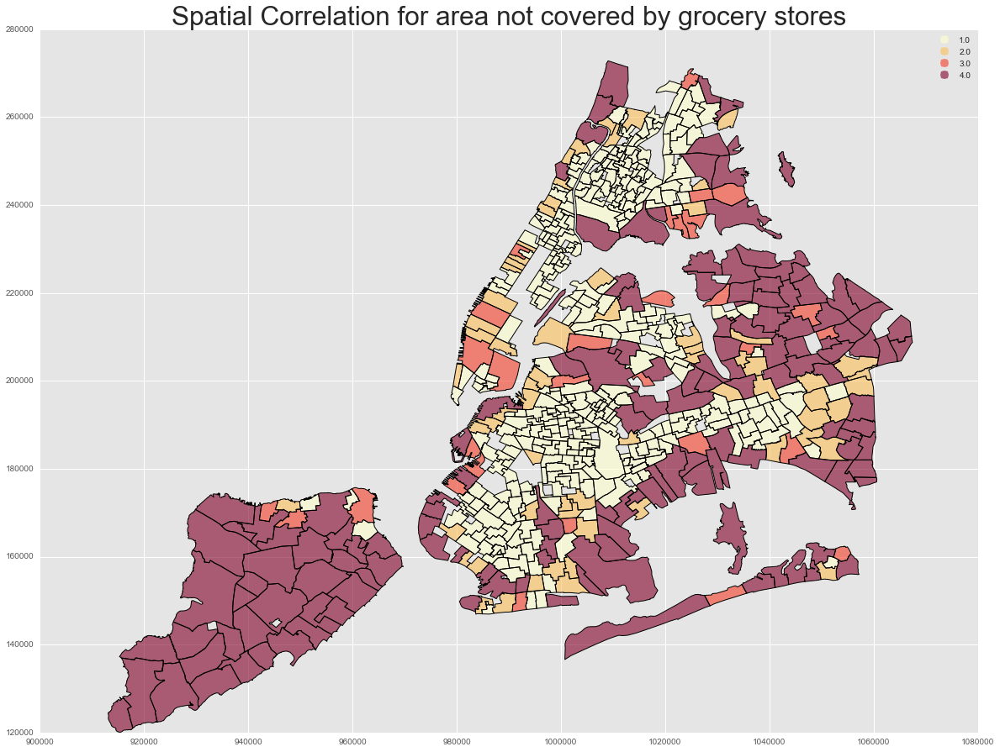

In [71]:
M = final['uncovered_area'].values
M = (M-M.mean())/M.std()
# Spatial lag
sp_lag_math = ps.lag_spatial(W, M)
final['uncovered_area_m'] = sp_lag_math
mi_math = ps.Moran(M, W) #Ignore warnings
print "Morans's I",mi_math.I #Tells us whether grocery stores are clustered in New York City
print 'P-value',mi_math.p_sim #Tells us whether Moran's I is significant
minim = final['uncovered_area_m'].min()
maxim = final['uncovered_area_m'].max()
f, ax = plt.subplots(figsize=(20,15))
final.plot(column='uncovered_area', alpha=0.6, colormap='YlOrRd', axes=ax, legend=True, categorical=True)
plt.title('Spatial Correlation for area not covered by grocery stores')
#mplleaflet.display(fig=f, crs={'init': 'epsg:2263'},tiles=('http://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png','attribution')) # NAD83 / New York Long Island (ftUS) EPSG:2263
#ax, _ = mpl.colorbar.make_axes(plt.gca(), shrink=0.5)
#cbar = mpl.colorbar.ColorbarBase(ax, cmap='YlOrRd',norm=mpl.colors.Normalize(vmin=minim, vmax=maxim))
plt.savefig("SpatialCorrelation.png")

In [72]:
# Try different desert measure:
final['desert'] = final['uncovered_area']-final['Bus_Stops']-final['Subway']-final['Farmers_Market_Count']#*1/final['Pct_Car_Unavailable']
final['desert'].describe()
formula = 'Weighted_Grades_Total  ~  desert  +   Average_Class_Size   +   Weighted_ELL_trans   +   Weighted_Economic_Need_Index   +   Weighted_Share_Minorities   +   Pct_Bachelor_trans   +   Pct_College   +   Pct_High_School'
model = smf.ols(formula = formula,data=final,missing='drop').fit()
print model.summary()

                              OLS Regression Results                             
Dep. Variable:     Weighted_Grades_Total   R-squared:                       0.740
Model:                               OLS   Adj. R-squared:                  0.736
Method:                    Least Squares   F-statistic:                     211.2
Date:                   Sun, 06 Mar 2016   Prob (F-statistic):          2.64e-168
Time:                           20:58:51   Log-Likelihood:                -203.81
No. Observations:                    604   AIC:                             425.6
Df Residuals:                        595   BIC:                             465.3
Df Model:                              8                                         
Covariance Type:               nonrobust                                         
                                   coef    std err          t      P>|t|      [95.0% Conf. Int.]
-----------------------------------------------------------------------------------